<a href="https://colab.research.google.com/github/lKAYNONl/MLlab/blob/main/lab1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np                # математика
import pandas as pd               # работа с табличными данными

import matplotlib.pyplot as plt   # визуализация
import seaborn as sns                   # визуализация

import os

from google.colab import data_table
data_table.enable_dataframe_formatter()


In [2]:
# set the environment variable for the API key
os.environ['KAGGLE_USERNAME'] = "kaynomi" # your Kaggle username
os.environ['KAGGLE_KEY'] = "c92a51b40c941f720d14a21ddbf7e690" # your Kaggle key

# загрузить фрейм данных из загруженного файла

# download the dataset
!kaggle datasets download -d wenruliu/adult-income-dataset

# unzip the dataset
!unzip adult-income-dataset.zip



  0% 0.00/652k [00:00<?, ?B/s]
100% 652k/652k [00:00<00:00, 25.5MB/s]
Archive:  adult-income-dataset.zip
  inflating: adult.csv               


In [3]:

df = pd.read_csv("adult.csv")
# посмотрим на тех данные
print(df.info())

# посмотрим на количество столбцов
print(df.shape[1])

# посмотрим на не численные
non_numeric_columns = df.select_dtypes(exclude='number').columns
print(non_numeric_columns)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   age              48842 non-null  int64 
 1   workclass        48842 non-null  object
 2   fnlwgt           48842 non-null  int64 
 3   education        48842 non-null  object
 4   educational-num  48842 non-null  int64 
 5   marital-status   48842 non-null  object
 6   occupation       48842 non-null  object
 7   relationship     48842 non-null  object
 8   race             48842 non-null  object
 9   gender           48842 non-null  object
 10  capital-gain     48842 non-null  int64 
 11  capital-loss     48842 non-null  int64 
 12  hours-per-week   48842 non-null  int64 
 13  native-country   48842 non-null  object
 14  income           48842 non-null  object
dtypes: int64(6), object(9)
memory usage: 5.6+ MB
None
15
Index(['workclass', 'education', 'marital-status', 'occupation',
   

In [4]:
df['age'].dropna().values

array([25, 38, 28, ..., 58, 22, 52])

Изучите статистику по данным

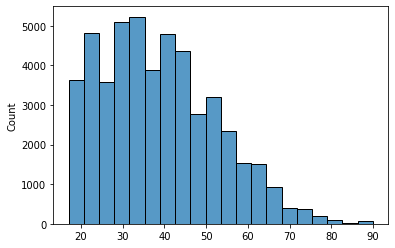

In [5]:

sns.histplot( df['age'].dropna().values, bins=20 )

In [6]:
# Статистическая информация о числовых признаках
df.describe()

,age,fnlwgt,educational-num,capital-gain,capital-loss,hours-per-week
count,48842.000000,4.884200e+04,48842.000000,48842.000000,48842.000000,48842.000000
mean,38.643585,1.896641e+05,10.078089,1079.067626,87.502314,40.422382
std,13.710510,1.056040e+05,2.570973,7452.019058,403.004552,12.391444
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.175505e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.781445e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.376420e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.490400e+06,16.000000,99999.000000,4356.000000,99.000000


Удалите пропуски, дубликаты, выбросы.
Сколько данных осталось?
Пришлось ли удалять столбцы.

In [7]:

df.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
48837    False
48838    False
48839    False
48840    False
48841    False
Length: 48842, dtype: bool

In [8]:
print(f"число дубликатов { df.duplicated().sum() }")

# дублирующиеся строки
df[ df.duplicated() ]

число дубликатов 52


,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
864,24,Private,194630,Bachelors,13,Never-married,Prof-specialty,Not-in-family,White,Male,0,0,35,United-States,<=50K
11189,37,Private,52870,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,40,United-States,<=50K
11212,29,Private,36440,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Female,0,0,40,United-States,<=50K
13848,30,Private,180317,Assoc-voc,11,Divorced,Machine-op-inspct,Not-in-family,White,Male,0,0,40,United-States,<=50K
15960,18,Self-emp-inc,378036,12th,8,Never-married,Farming-fishing,Own-child,White,Male,0,0,10,United-States,<=50K
18476,39,Private,184659,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,<=50K
19399,19,Private,130431,5th-6th,3,Never-married,Farming-fishing,Not-in-family,White,Male,0,0,36,Mexico,<=50K
19726,41,Private,116391,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,40,United-States,>50K
20606,25,Private,308144,Bachelors,13,Never-married,Craft-repair,Not-in-family,White,Male,0,0,40,Mexico,<=50K
21162,25,Private,308144,Bachelors,13,Never-married,Craft-repair,Not-in-family,White,Male,0,0,40,Mexico,<=50K


In [9]:
# replace the '?' character with np.nan
df = df.replace('?', np.nan)

df.isna()

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48837,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
48838,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
48839,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
48840,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [10]:
df.isna().sum(axis=0)

age                   0
workclass          2799
fnlwgt                0
education             0
educational-num       0
marital-status        0
occupation         2809
relationship          0
race                  0
gender                0
capital-gain          0
capital-loss          0
hours-per-week        0
native-country      857
income                0
dtype: int64

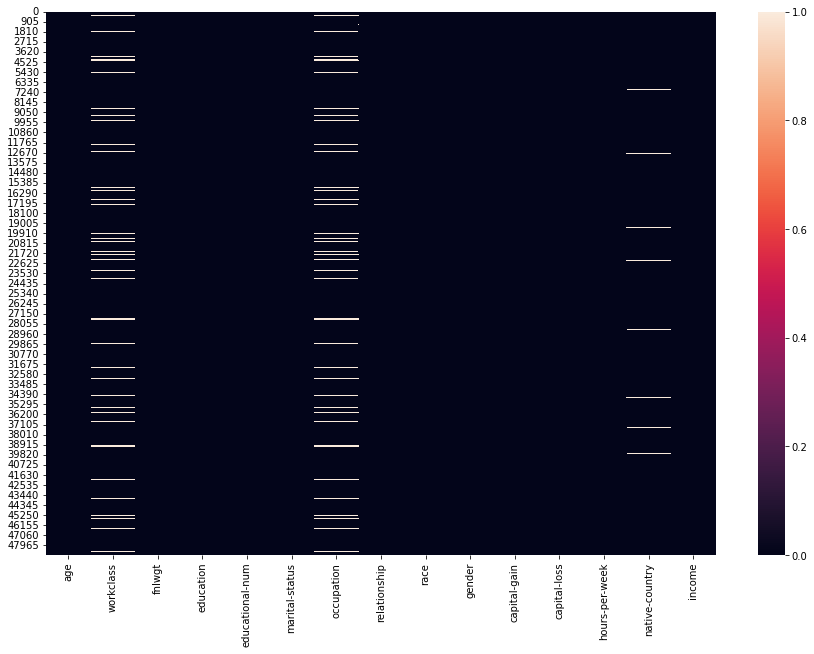

In [11]:
# пропуски можно визуализировать
# построим из таблицы тепловую карту, где светлым отметим пропуски (True значения, которые вернёт data0.isna())
plt.figure( figsize=(15,10) )   # для удобства сделаем график большим
sns.heatmap( df.isna() )

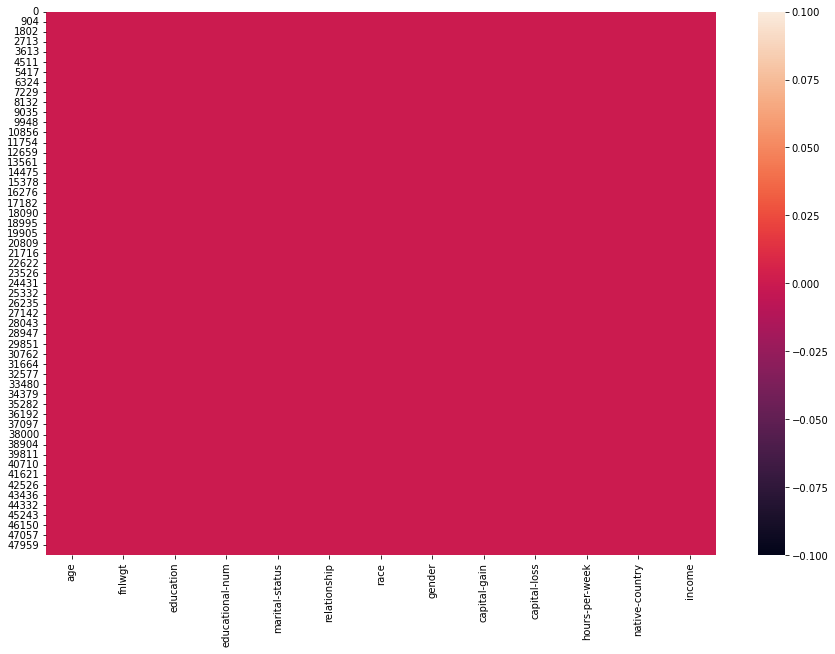

In [12]:
df = df.drop( columns=['workclass', 'occupation'] )
df = df.dropna()

plt.figure( figsize=(15,10) )   # для удобства сделаем график большим
sns.heatmap( df.isna() )

In [13]:
df

,age,fnlwgt,education,educational-num,marital-status,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,226802,11th,7,Never-married,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,89814,HS-grad,9,Married-civ-spouse,Husband,White,Male,0,0,50,United-States,<=50K
2,28,336951,Assoc-acdm,12,Married-civ-spouse,Husband,White,Male,0,0,40,United-States,>50K
3,44,160323,Some-college,10,Married-civ-spouse,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,103497,Some-college,10,Never-married,Own-child,White,Female,0,0,30,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...
48837,27,257302,Assoc-acdm,12,Married-civ-spouse,Wife,White,Female,0,0,38,United-States,<=50K
48838,40,154374,HS-grad,9,Married-civ-spouse,Husband,White,Male,0,0,40,United-States,>50K
48839,58,151910,HS-grad,9,Widowed,Unmarried,White,Female,0,0,40,United-States,<=50K
48840,22,201490,HS-grad,9,Never-married,Own-child,White,Male,0,0,20,United-States,<=50K


Сделайте несколько простых запросов к таблице данных. Например: показать всех белых людей с доходом больше 50 тыс.

In [14]:
df['income']

0        <=50K
1        <=50K
2         >50K
3         >50K
4        <=50K
         ...  
48837    <=50K
48838     >50K
48839    <=50K
48840    <=50K
48841     >50K
Name: income, Length: 47985, dtype: object

In [15]:
df[['income','age', 'native-country']]

,income,age,native-country
0,<=50K,25,United-States
1,<=50K,38,United-States
2,>50K,28,United-States
3,>50K,44,United-States
4,<=50K,18,United-States
...,...,...,...
48837,<=50K,27,United-States
48838,>50K,40,United-States
48839,<=50K,58,United-States
48840,<=50K,22,United-States


In [16]:
data0 = df[df['income']=='>50K']
data0


,age,fnlwgt,education,educational-num,marital-status,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
2,28,336951,Assoc-acdm,12,Married-civ-spouse,Husband,White,Male,0,0,40,United-States,>50K
3,44,160323,Some-college,10,Married-civ-spouse,Husband,Black,Male,7688,0,40,United-States,>50K
7,63,104626,Prof-school,15,Married-civ-spouse,Husband,White,Male,3103,0,32,United-States,>50K
10,65,184454,HS-grad,9,Married-civ-spouse,Husband,White,Male,6418,0,40,United-States,>50K
14,48,279724,HS-grad,9,Married-civ-spouse,Husband,White,Male,3103,0,48,United-States,>50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...
48820,71,287372,Doctorate,16,Married-civ-spouse,Husband,White,Male,0,0,10,United-States,>50K
48826,39,111499,Assoc-acdm,12,Married-civ-spouse,Wife,White,Female,0,0,20,United-States,>50K
48835,53,321865,Masters,14,Married-civ-spouse,Husband,White,Male,0,0,40,United-States,>50K
48838,40,154374,HS-grad,9,Married-civ-spouse,Husband,White,Male,0,0,40,United-States,>50K


In [17]:
data0.describe()

,age,fnlwgt,educational-num,capital-gain,capital-loss,hours-per-week
count,11467.000000,1.146700e+04,11467.000000,11467.000000,11467.000000,11467.000000
mean,44.277841,1.883266e+05,11.589779,3994.075434,192.978896,45.455481
std,10.566959,1.025247e+05,2.374246,14609.080192,592.141069,11.093493
min,19.000000,1.376900e+04,1.000000,0.000000,0.000000,1.000000
25%,36.000000,1.187610e+05,10.000000,0.000000,0.000000,40.000000
50%,43.000000,1.767160e+05,12.000000,0.000000,0.000000,40.000000
75%,51.000000,2.334325e+05,13.000000,0.000000,0.000000,50.000000
max,90.000000,1.226583e+06,16.000000,99999.000000,3683.000000,99.000000


In [18]:
data1 = df[df['income']=='<=50K']
data1.describe()

,age,fnlwgt,educational-num,capital-gain,capital-loss,hours-per-week
count,36518.000000,3.651800e+04,36518.000000,36518.000000,36518.000000,36518.000000
mean,36.871351,1.899920e+05,9.589134,147.912591,54.208527,38.827619
std,14.125366,1.067546e+05,2.426651,942.208750,313.646625,12.353673
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,25.000000,1.169332e+05,9.000000,0.000000,0.000000,35.000000
50%,34.000000,1.787615e+05,9.000000,0.000000,0.000000,40.000000
75%,46.000000,2.390535e+05,10.000000,0.000000,0.000000,40.000000
max,90.000000,1.490400e+06,16.000000,41310.000000,4356.000000,99.000000


Группировки

In [19]:
df.groupby(['gender','income']).count()

age  fnlwgt  education  educational-num  marital-status  \
gender income                                                              
Female <=50K   14203   14203      14203            14203           14203   
       >50K     1741    1741       1741             1741            1741   
Male   <=50K   22315   22315      22315            22315           22315   
       >50K     9726    9726       9726             9726            9726   

               relationship   race  capital-gain  capital-loss  \
gender income                                                    
Female <=50K          14203  14203         14203         14203   
       >50K            1741   1741          1741          1741   
Male   <=50K          22315  22315         22315         22315   
       >50K            9726   9726          9726          9726   

               hours-per-week  native-country  
gender income                                  
Female <=50K            14203           14203  
       >50K              1741            1741  
Male   <=50K            22315           22315  
       >50K              9726            9726

In [20]:
df.groupby(['gender','income'])['age'].mean()

gender  income
Female  <=50K     36.266352
        >50K      42.207352
Male    <=50K     37.256419
        >50K      44.648468
Name: age, dtype: float64

In [21]:
df[  (df['race']=='White') & (df['income']=='>50K') ]

,age,fnlwgt,education,educational-num,marital-status,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
2,28,336951,Assoc-acdm,12,Married-civ-spouse,Husband,White,Male,0,0,40,United-States,>50K
7,63,104626,Prof-school,15,Married-civ-spouse,Husband,White,Male,3103,0,32,United-States,>50K
10,65,184454,HS-grad,9,Married-civ-spouse,Husband,White,Male,6418,0,40,United-States,>50K
14,48,279724,HS-grad,9,Married-civ-spouse,Husband,White,Male,3103,0,48,United-States,>50K
15,43,346189,Masters,14,Married-civ-spouse,Husband,White,Male,0,0,50,United-States,>50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...
48820,71,287372,Doctorate,16,Married-civ-spouse,Husband,White,Male,0,0,10,United-States,>50K
48826,39,111499,Assoc-acdm,12,Married-civ-spouse,Wife,White,Female,0,0,20,United-States,>50K
48835,53,321865,Masters,14,Married-civ-spouse,Husband,White,Male,0,0,40,United-States,>50K
48838,40,154374,HS-grad,9,Married-civ-spouse,Husband,White,Male,0,0,40,United-States,>50K


In [22]:
df[  (df['relationship']=='Not-in-family') & (df['marital-status']=='Never-married') & (df['native-country']=='Canada')&  (df['income']=='>50K') ]

,age,fnlwgt,education,educational-num,marital-status,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
6138,49,101320,Bachelors,13,Never-married,Not-in-family,White,Female,0,1564,40,Canada,>50K
12147,25,223426,Assoc-voc,11,Never-married,Not-in-family,White,Male,0,0,65,Canada,>50K
15024,48,192755,Bachelors,13,Never-married,Not-in-family,White,Female,0,0,55,Canada,>50K
33819,38,37683,Prof-school,15,Never-married,Not-in-family,Asian-Pac-Islander,Female,99999,0,57,Canada,>50K


Сделайте несколько визуализаций:

Гистограммы частот

Ящики с усами и скрипки

Попарные диаграммы рассеивания

Нарисуйте разным цветом объекты с разным значением целевой переменной -- доход

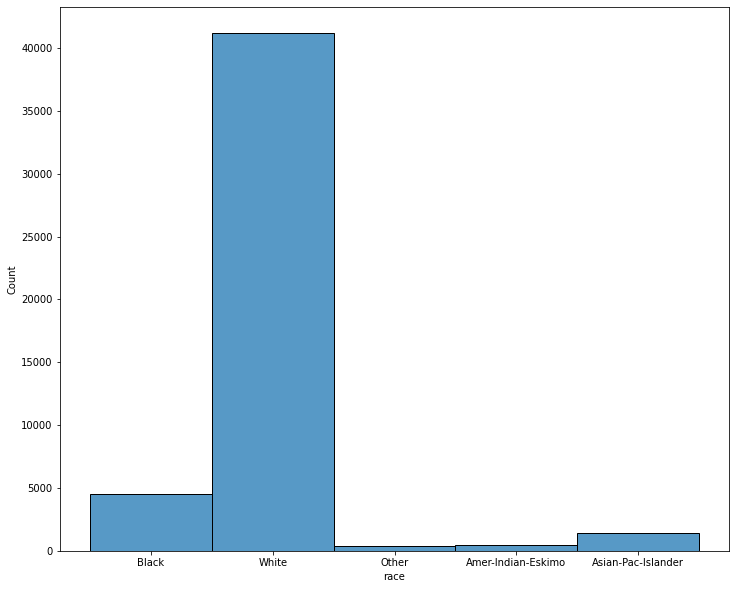

In [23]:
# простая гистограмма
plt.figure( figsize=(12,10) )
sns.histplot( df['race'], discrete=True )

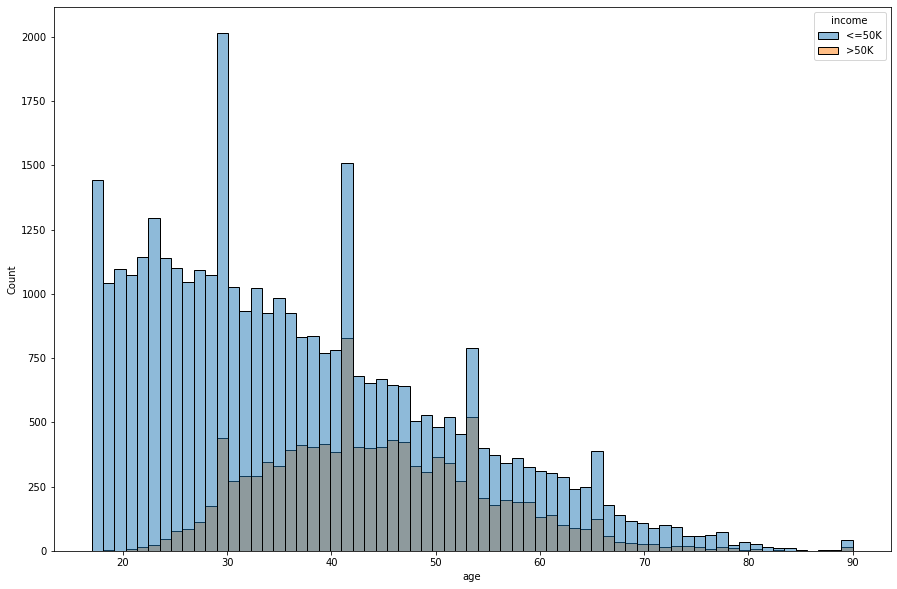

In [24]:
plt.figure( figsize=(15,10) )
sns.histplot(data= df,x='age',hue='income')

Удаление Выбросов

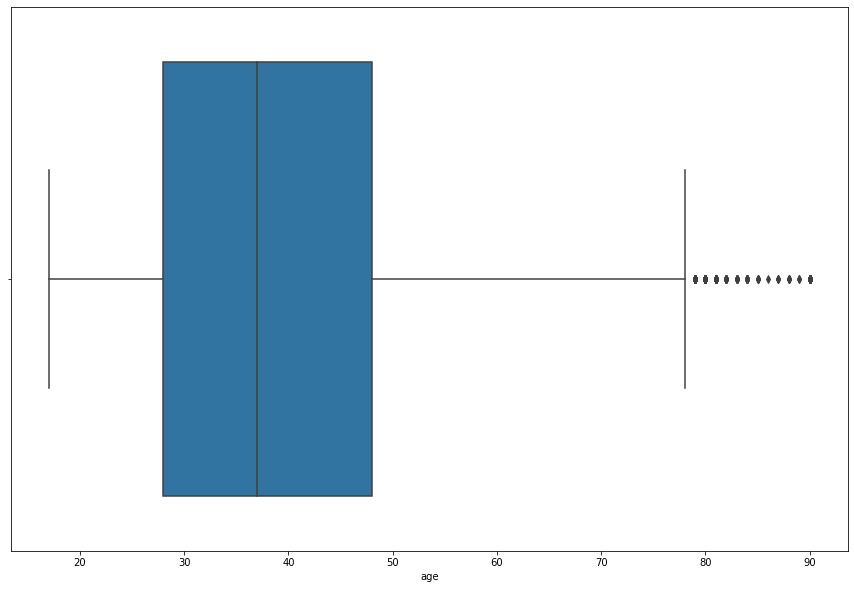

In [25]:
plt.figure( figsize=(15,10) )
sns.boxplot(data=df, x ='age' )

In [26]:
# Задаем границы выбросов (например, выбросом считается значение, которое находится за пределами межквартильного размаха)
q1, q3 = np.percentile(df['age'], [25, 75])
iqr = q3 - q1
lower_bound = q1 - (1.5 * iqr)
upper_bound = q3 + (1.5 * iqr)

# Удаляем выбросы
df = df[(df['age'] > lower_bound) & (df['age'] < upper_bound)]

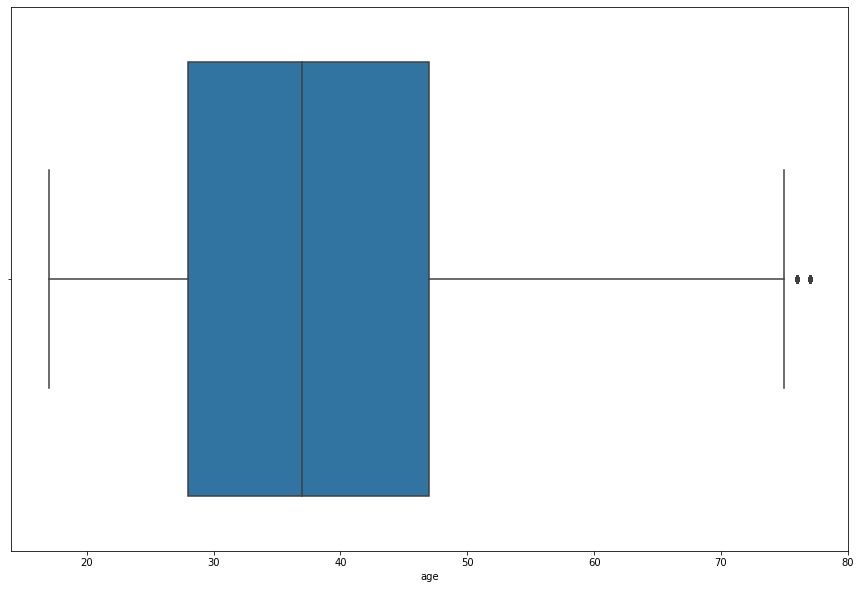

In [27]:
plt.figure( figsize=(15,10) )
sns.boxplot(data=df, x ='age' )

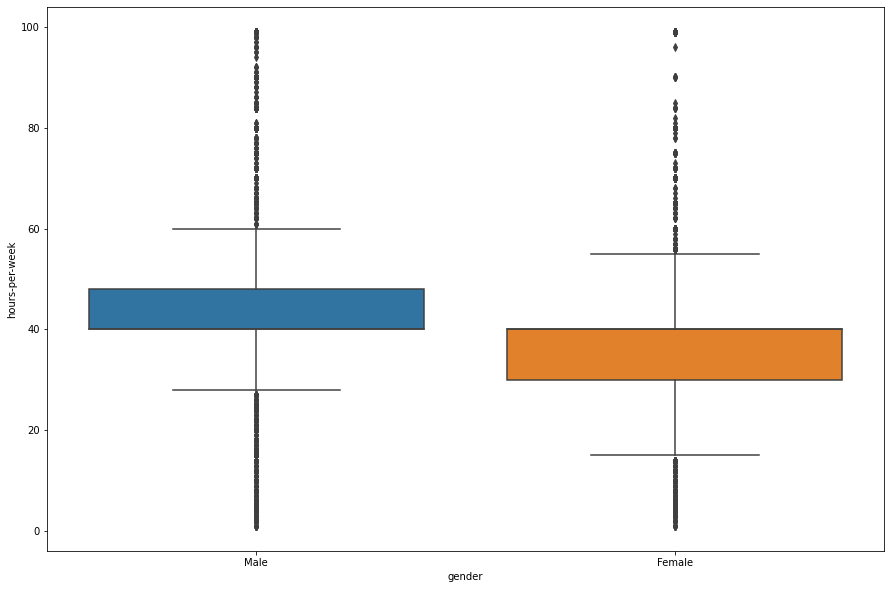

In [28]:
plt.figure( figsize=(15,10) )
sns.boxplot(data=df, x ='gender', y='hours-per-week')

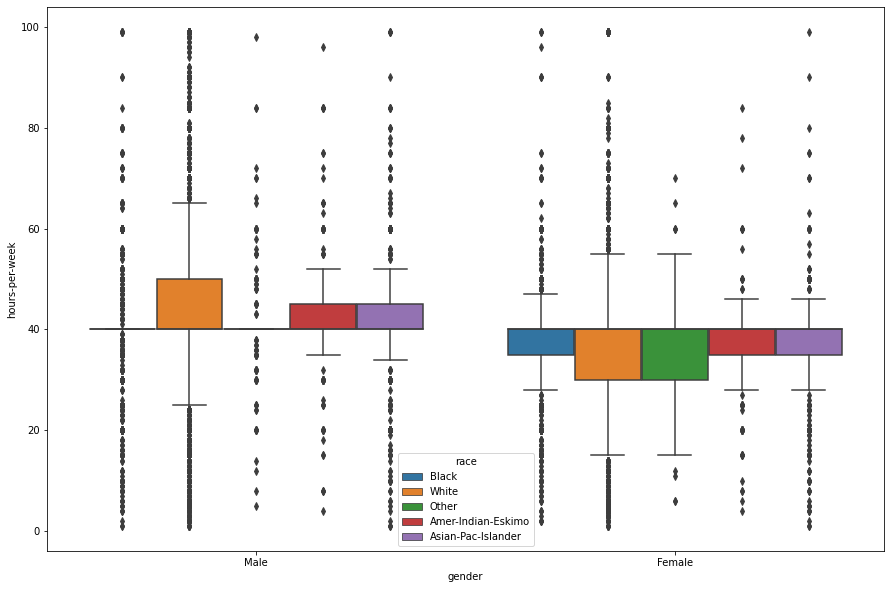

In [29]:
plt.figure( figsize=(15,10) )
sns.boxplot(data=df, x ='gender', y='hours-per-week' , hue = 'race')

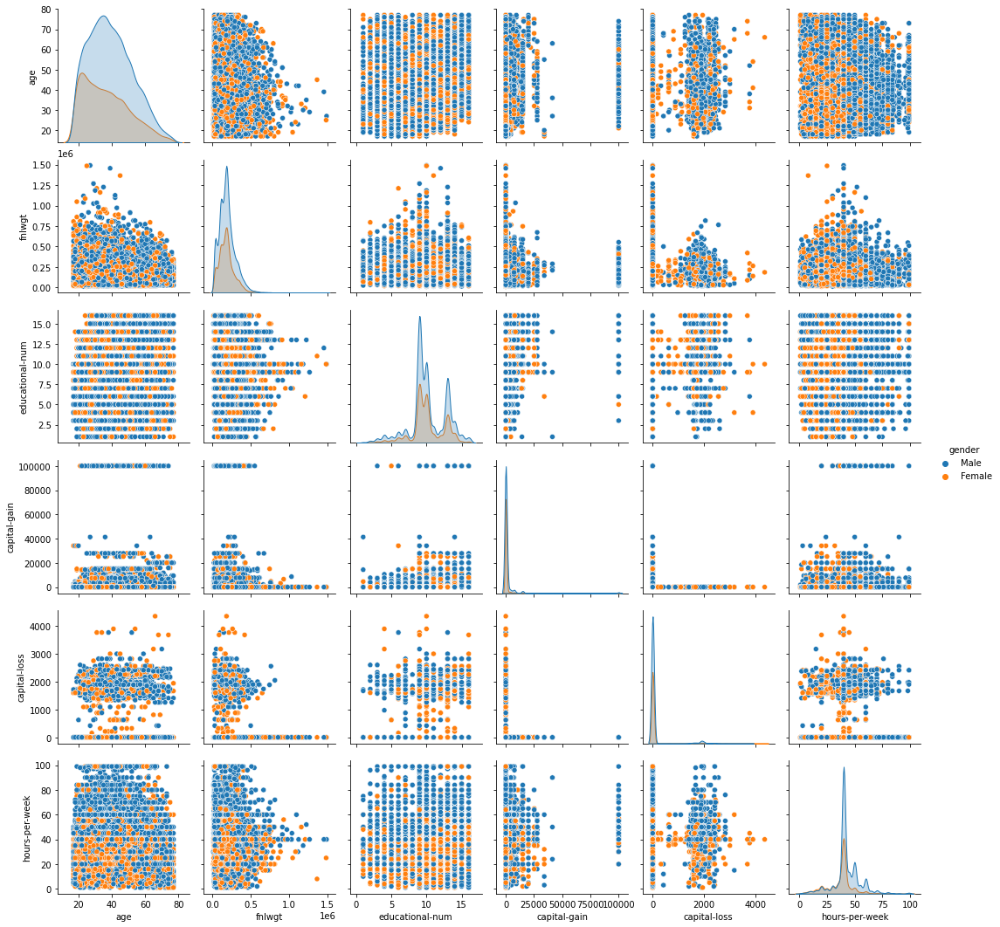

In [30]:
sns.pairplot(df, hue='gender')

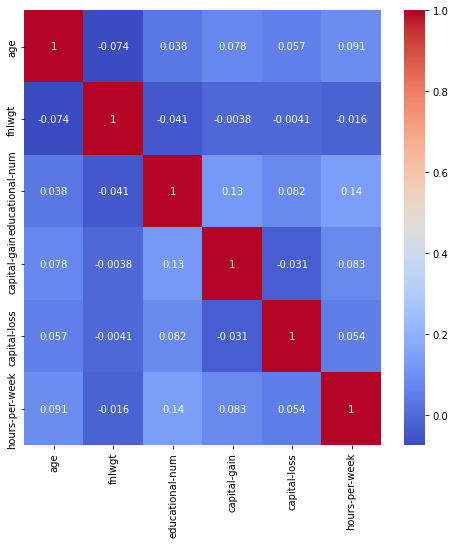

In [31]:
plt.figure( figsize=(8,8) )
sns.heatmap(df.corr(), annot=True,cmap='coolwarm')

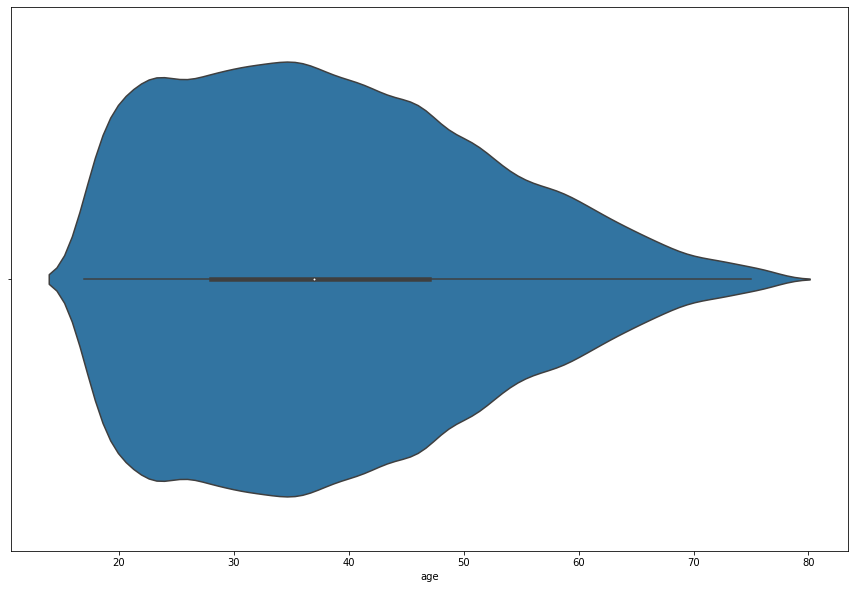

In [32]:
plt.figure( figsize=(15,10) )
sns.violinplot(data=df, x='age')

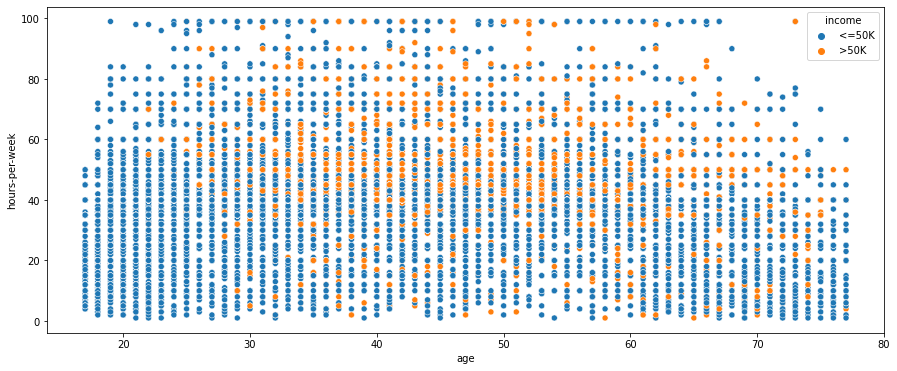

In [33]:
plt.figure( figsize=(15,6) )
sns.scatterplot( x='age', y ='hours-per-week', hue='income', data=df ) 

